# Imports and function definitions

In [1]:
import json
import tiledbsoma as soma
import cellxgene_census
import numpy as np
import scanpy as sc
from anndata import AnnData
import anndata


def soma_context() -> soma.options.SOMATileDBContext:
    """
    Helper function. Returns a config which uses larger I/O buffers and reads from AWS S3 us-west-2 region.
    """
    return soma.options.SOMATileDBContext(
        tiledb_config={
            "soma.init_buffer_bytes": 4 * 1024**3,
            "py.init_buffer_bytes": 4 * 1024**3,
            "vfs.s3.region": "us-west-2",
        }
    )

def generate_umaps_from_embeddings(adata: AnnData, emb_names: list, metric='euclidean'):
    """
    Generate UMAPs from embeddings stored in `adata.obsm`.
    `emb_names` is a list that contains keys present in `adata.obsm`.
    """
    
    adata=adata.copy()
    for emb_name in emb_names:
        print(f"Generating UMAP for {emb_name}")
        sc.pp.neighbors(adata,n_neighbors=15,use_rep=emb_name,method="umap", key_added=emb_name, metric=metric)
        sc.tl.umap(adata, neighbors_key=emb_name)
        X_emb_name = emb_name if emb_name[:2] == "X_" else f"X_{emb_name}"
        if metric != 'euclidean':
            X_emb_name += f"_{metric}"
        adata.obsm[f"{X_emb_name}_umap"] = adata.obsm["X_umap"]
        del adata.obsm["X_umap"]
        
    adata.var_names = adata.var['feature_name']
    adata.raw = adata.copy()
    sc.pp.normalize_total(adata,target_sum=10000)
    sc.pp.log1p(adata)
    
    return adata
    
def build_anndata_with_embeddings(embedding_uris: dict, obs_query: soma.AxisQuery):
    """
    For a given `obs_query` (soma.AxisQuery), fetch embeddings with TileDBSoma and return
    the corresponding AnnData with embeddings slotted in.

    `embedding_uris` is a dict with embedding name as the keys and S3 URI as the values.
    """
    
    flag = False
    for key in embedding_uris:        
        
        embedding_uri = embedding_uris[key]
        with soma.open(embedding_uri, context=soma_context()) as E:
            embedding_metadata = json.loads(E.metadata["CxG_contrib_metadata"])
        census_version = embedding_metadata["census_version"]
        experiment_name = embedding_metadata["experiment_name"]
        
        print("Embedding metadata for",embedding_uri)
        print(embedding_metadata)
        
        with cellxgene_census.open_soma(census_version=census_version) as census:
            experiment = census["census_data"][experiment_name]
            with experiment.axis_query(
                measurement_name="RNA",
                obs_query=obs_query,
            ) as query:
    
                if not flag:
                    # Load AnnData and X[raw] - do this once for the first embedding                  
                    ad = query.to_anndata(X_name="raw")
                    flag=True
                
                # Load embedding associated with the obs joinids
                with soma.open(embedding_uri, context=soma_context()) as E:
                    # read embedding and obs joinids
                    embedding_data = np.vstack(
                        list(
                            blk.toarray()
                            for blk, _ in E.read(coords=(query.obs_joinids().to_numpy(),))
                            .blockwise(axis=0, size=2**20, reindex_disable_on_axis=1)
                            .scipy(compress=False)
                        )
                    )
    
                # Save as an obsm layer
                ad.obsm[key] = embedding_data

    # Embeddings with missing data contain all zeros,
    # so we must find the intersection of nonzero rows in the fetched embeddings
    # and subset the AnnData accordingly.
    filt = np.ones(ad.shape[0], dtype='bool')
    for key in embedding_uris:
        filt = filt & ( ad.obsm[key].sum(1)!=0 )
    ad = ad[filt].copy()
    
    return ad
            

# Fetch expression and embedding data from Census for a few examples

In [6]:
# human embeddings from scgpt, uce, geneformer, and scvi models
embedding_uris = {
    "scgpt": "s3://bruce-tmp/emb-bfloat16/CxG-contrib-1/",
    "uce": "s3://bruce-tmp/emb-bfloat16/CxG-contrib-2/",
    "geneformer": "s3://bruce-tmp/emb-bfloat16/CxG-czi-1/",
    "scvi": "s3://bruce-tmp/emb-bfloat16/CxG-czi-3/",
}

## Fetch 150k cells from eye tissue

In [8]:
obs_value_filter = "tissue_general=='eye' and is_primary_data == True"
with cellxgene_census.open_soma(census_version='2023-10-23') as census:
    experiment = census["census_data"]['homo_sapiens']
    with experiment.axis_query(
        measurement_name="RNA",
        obs_query=soma.AxisQuery(value_filter=obs_value_filter),
    ) as query:
        obs_df = query.obs().concat().to_pandas()

print(obs_df.shape[0],'cells in',obs_value_filter)

idx_rand = np.random.choice(obs_df.shape[0],size=150000,replace=False)
obs_query = soma.AxisQuery(coords=(obs_df['soma_joinid'].values[idx_rand].tolist(),))

adata = build_anndata_with_embeddings(embedding_uris, obs_query)
adata = generate_umaps_from_embeddings(adata, list(embedding_uris.keys()))

adata.write_h5ad('census__eye_subset150k.h5ad')

{'id': 'CxG-contrib-1', 'title': 'scGPT: Towards Building a Foundation Model for Single-Cell Multi-omics Using Generative AI', 'description': 'Utilizing the burgeoning single-cell sequencing data, we have pioneered the construction of a foundation model for single-cell biology, scGPT, which is based on generative pre-trained transformer across a repository of over 33 million cells. Our findings illustrate that scGPT, a generative pre-trained transformer, effectively distills critical biological insights concerning genes and cells. Through the further adaptation of transfer learning, scGPT can be optimized to achieve superior performance across diverse downstream applications.\n', 'contact_name': 'Bo Wang', 'contact_email': 'bowang@vectorinstitute.ai', 'contact_affiliation': 'Bo Wang Lab, University of Toronto', 'DOI': '10.1101/2023.04.30.538439', 'additional_information': '', 'model_link': 'https://github.com/bowang-lab/scGPT', 'data_type': 'obs_embedding', 'census_version': '2023-10-2

## Fetch 150k cells from brain tissue

In [11]:
obs_value_filter = "tissue_general=='brain' and is_primary_data == True"
with cellxgene_census.open_soma(census_version='2023-10-23') as census:
    experiment = census["census_data"]['homo_sapiens']
    with experiment.axis_query(
        measurement_name="RNA",
        obs_query=soma.AxisQuery(value_filter=obs_value_filter),
    ) as query:
        obs_df = query.obs().concat().to_pandas()

print(obs_df.shape[0],'cells in',obs_value_filter)

idx_rand = np.random.choice(obs_df.shape[0],size=150000,replace=False)
obs_query = soma.AxisQuery(coords=(obs_df['soma_joinid'].values[idx_rand].tolist(),))

adata = build_anndata_with_embeddings(embedding_uris, obs_query)
adata = generate_umaps_from_embeddings(adata, list(embedding_uris.keys()))

adata.write_h5ad('census__brain_subset150k.h5ad')

{'id': 'CxG-contrib-1', 'title': 'scGPT: Towards Building a Foundation Model for Single-Cell Multi-omics Using Generative AI', 'description': 'Utilizing the burgeoning single-cell sequencing data, we have pioneered the construction of a foundation model for single-cell biology, scGPT, which is based on generative pre-trained transformer across a repository of over 33 million cells. Our findings illustrate that scGPT, a generative pre-trained transformer, effectively distills critical biological insights concerning genes and cells. Through the further adaptation of transfer learning, scGPT can be optimized to achieve superior performance across diverse downstream applications.\n', 'contact_name': 'Bo Wang', 'contact_email': 'bowang@vectorinstitute.ai', 'contact_affiliation': 'Bo Wang Lab, University of Toronto', 'DOI': '10.1101/2023.04.30.538439', 'additional_information': '', 'model_link': 'https://github.com/bowang-lab/scGPT', 'data_type': 'obs_embedding', 'census_version': '2023-10-2

## Fetch lung cells from Tabula Sapiens

In [11]:
obs_value_filter = "tissue_general=='lung' and dataset_id=='53d208b0-2cfd-4366-9866-c3c6114081bc'"

obs_query = soma.AxisQuery(value_filter=obs_value_filter)

adata = build_anndata_with_embeddings(embedding_uris, obs_query)
adata = generate_umaps_from_embeddings(adata, list(embedding_uris.keys()))

adata.write_h5ad('census__lung_tabula_sapiens.h5ad')

{'id': 'CxG-contrib-1', 'title': 'scGPT: Towards Building a Foundation Model for Single-Cell Multi-omics Using Generative AI', 'description': 'Utilizing the burgeoning single-cell sequencing data, we have pioneered the construction of a foundation model for single-cell biology, scGPT, which is based on generative pre-trained transformer across a repository of over 33 million cells. Our findings illustrate that scGPT, a generative pre-trained transformer, effectively distills critical biological insights concerning genes and cells. Through the further adaptation of transfer learning, scGPT can be optimized to achieve superior performance across diverse downstream applications.\n', 'contact_name': 'Bo Wang', 'contact_email': 'bowang@vectorinstitute.ai', 'contact_affiliation': 'Bo Wang Lab, University of Toronto', 'DOI': '10.1101/2023.04.30.538439', 'additional_information': '', 'model_link': 'https://github.com/bowang-lab/scGPT', 'data_type': 'obs_embedding', 'census_version': '2023-10-2

# Embedding explorations

In this notebook, we explore various models' embeddings using UMAP as a visualization tool.  The journey from a gene expression matrix to a 2D scatterplot involves numerous highly nonlinear transformations. Such transformations can introduce artifacts that affect both the global and local structures in the visualized manifold. Common issues like overclustering and clustering by batch are typical artifacts resulting from these dimensionality reduction methods. With that in mind, these embeddings and their UMAP visualizations are best used as tools for generating hypotheses. They should not be the final word in analysis. Instead, we recommend focusing on the full representation of the embedding matrices and ultimately returning to the underlying gene expressions to investigate the reasons behind the observed clustering patterns.

One of the key objectives of foundation models in single-cell RNA sequencing is to embed cells within a universal coordinate system that minimizes the impact of technical variations, such as batch effects. However, as we will see in the examples presented in this notebook, cells often cluster by batch. This clustering could be biologically driven, as certain cell types or states might be unique to specific batches (e.g. datasets). In other cases, the separation might be purely due to systematic technical biases, or a combination of both biological and technical factors. Complicating the matter, the techniques used for nearest neighbor graph construction and 2D projection can themselves amplify batch effects. Rigorous benchmarking is necessary to fully assess each model's capability in integrating data within their respective latent spaces. This complexity highlights that data integration in single-cell RNA sequencing remains a challenging and unsolved problem. In this tutorial, we briefly highlight a few simple case studies that illustrate the capacity of these embeddings to capture intriguing biological phenomena.

## Dopaminergic neurons in brain

In the first case study, we visualize a randomly selected subset of cells in the brain from CELLxGENE Census. We can observe that dopaminergic neurons, marked by TH expression, separate into distinct clusters in Geneformer and SCVI latent spaces, whereas in UCE and scGPT embeddings, they are grouped at one end of a larger neuron cluster.

All embeddings show a tendency to cluster by assay, indicating a consistent pattern across different models. Conditions like epilepsy and glioblastoma are clearly separated in all embeddings, while pilocytic astrocytoma is distinctly clustered in UCE and more mixed in others.

In the UCE embedding, we observe small satellite clusters within the main glioblastoma cluster that do not have distinct gene expression signatures. This might be related to the high number of latent dimensions (1280) output by UCE.

In [14]:
adata1 = anndata.read_h5ad('census__brain_subset150k.h5ad')

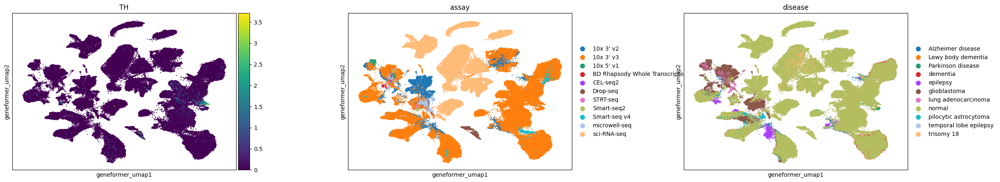

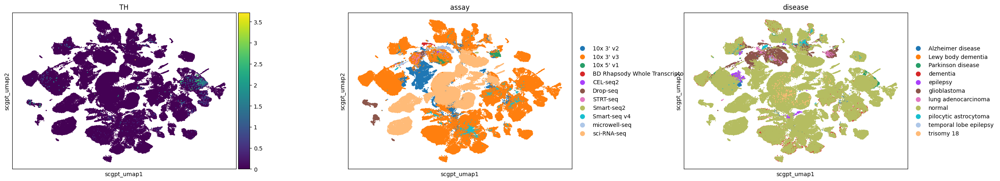

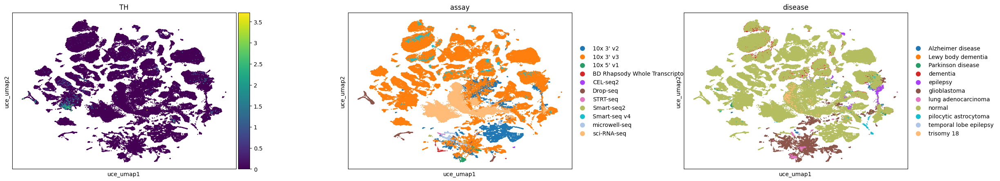

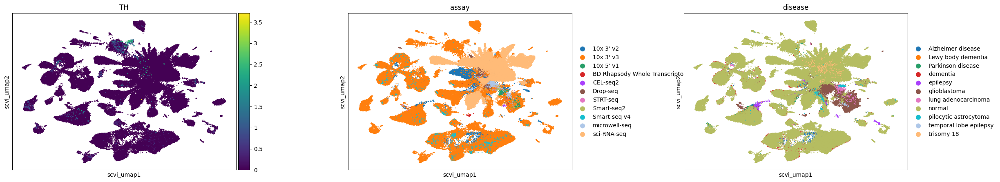

In [41]:
sc.pl.scatter(adata1, basis="geneformer_umap", color=["TH", "assay", "disease"],size=10, use_raw=False)
sc.pl.scatter(adata1, basis="scgpt_umap", color=["TH", "assay", "disease"],size=10, use_raw=False)
sc.pl.scatter(adata1, basis="uce_umap", color=["TH", "assay", "disease"],size=10, use_raw=False)
sc.pl.scatter(adata1, basis="scvi_umap", color=["TH", "assay", "disease"],size=10, use_raw=False)

## Pulmonary ionocytes in lung (Tabula Sapiens)
For the case study focusing on pulmonary ionocytes in lung tissue, as part of the Tabula Sapiens project, the following observations are noted:

- In all embeddings, except for SCVI, a clear separation is seen between SmartSeq data and 10x data. The distinction is most pronounced in the scGPT embedding.
- CFTR, a marker for pulmonary ionocytes, identifies a rare cell type in the lung. This cell type is distinctly recognizable in all the embeddings.

In [43]:
adata2 = anndata.read_h5ad('census__lung_tabula_sapiens.h5ad')

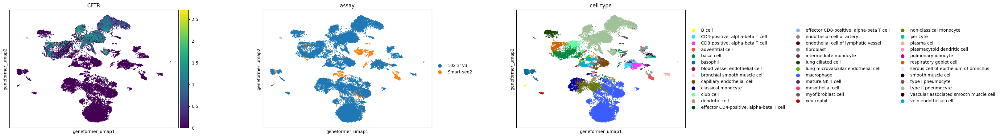

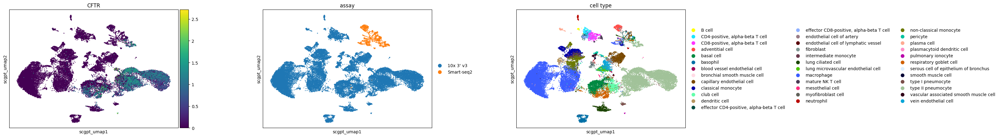

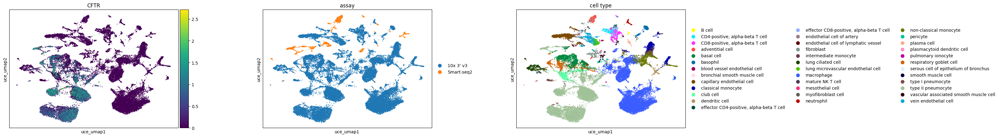

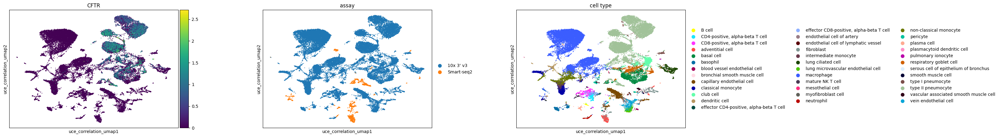

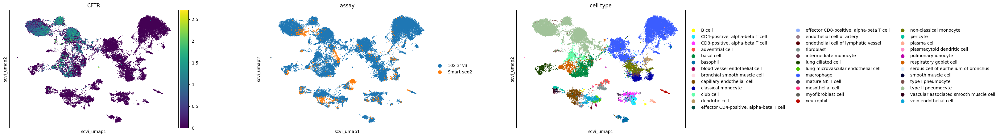

In [55]:
sc.pl.scatter(adata2, basis="geneformer_umap", color=["CFTR", "assay", "cell_type"],size=10, use_raw=False)
sc.pl.scatter(adata2, basis="scgpt_umap", color=["CFTR", "assay", "cell_type"],size=10, use_raw=False)
sc.pl.scatter(adata2, basis="uce_umap", color=["CFTR", "assay", "cell_type"],size=10, use_raw=False)
sc.pl.scatter(adata2, basis="scvi_umap", color=["CFTR", "assay", "cell_type"],size=10, use_raw=False)

## Melanocytes in eye

In the study of melanocytes within the eye, the following observations are made across various embeddings:

 - Melanocytes are distinctly clustered in all embeddings, with OCA2 as a noted marker.
 - KIT, [identified as a marker for mature melanocytes](https://iovs.arvojournals.org/article.aspx?articleid=2743921), shows varying degrees of separation. In SCVI and UCE embeddings, mature and immature melanocytes are clearly separable based on KIT expression. The scGPT embedding shows a slight extension from the main melanocyte cluster, indicative of some separation, where KIT expression is concentrated. In Geneformer, cells expressing KIT are primarily found at one end of the larger melanocyte cluster.
 - Across all embeddings, assays tend to cluster separately. The extent to which this reflects biological variability versus technical variation is unclear.
 - Qualitatively, SCVI appears to offer the best integration across different datasets, with other embeddings showing more pronounced clustering by dataset.
 - The UCE embedding demonstrates potential signs of overclustering. An example is seen in retinal bipolar neurons, which separate into numerous small satellite clusters in the upper-left of the UCE embedding without clear gene expression signatures.

In [2]:
adata3 = anndata.read_h5ad('census__eye_subset150k.h5ad')

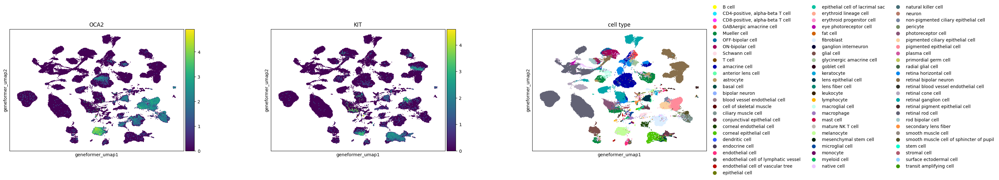

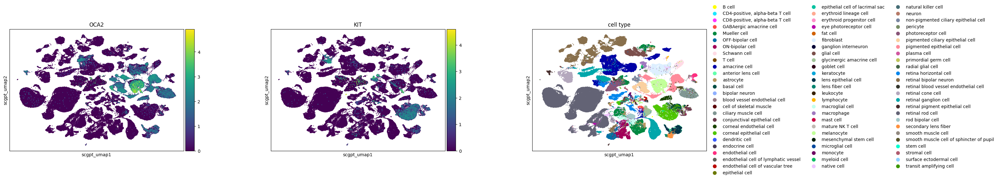

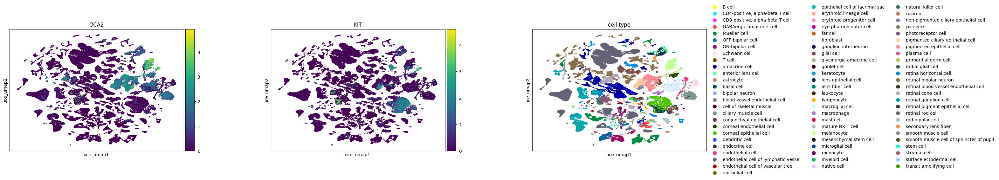

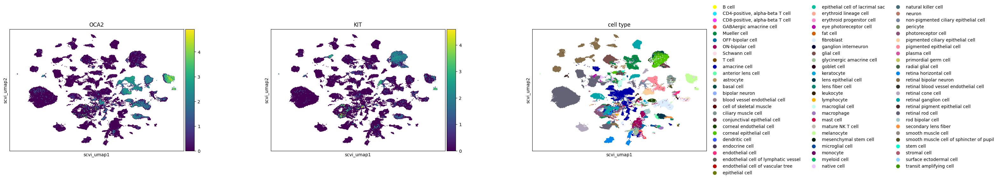

In [62]:
sc.pl.scatter(adata3, basis="geneformer_umap", color=["OCA2", "KIT", "cell_type"],size=10, use_raw=False)
sc.pl.scatter(adata3, basis="scgpt_umap", color=["OCA2", "KIT", "cell_type"],size=10, use_raw=False)
sc.pl.scatter(adata3, basis="uce_umap", color=["OCA2", "KIT", "cell_type"],size=10, use_raw=False)
sc.pl.scatter(adata3, basis="scvi_umap", color=["OCA2", "KIT", "cell_type"],size=10, use_raw=False)

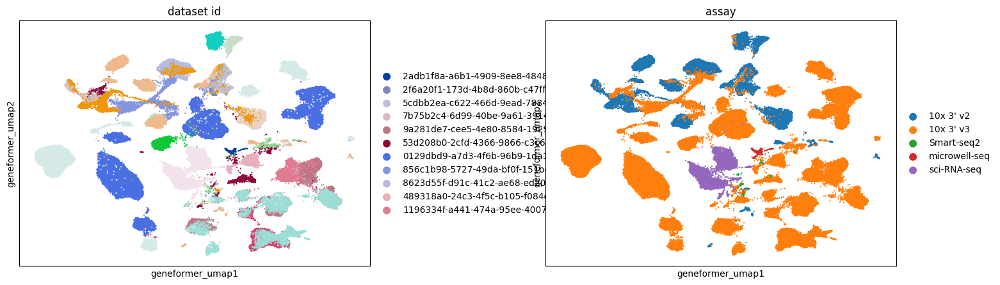

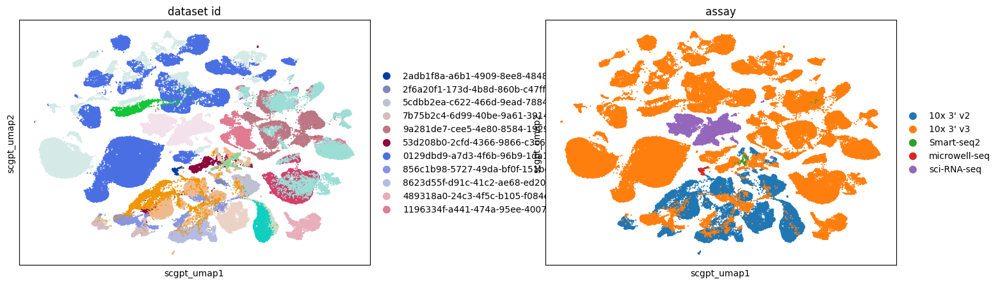

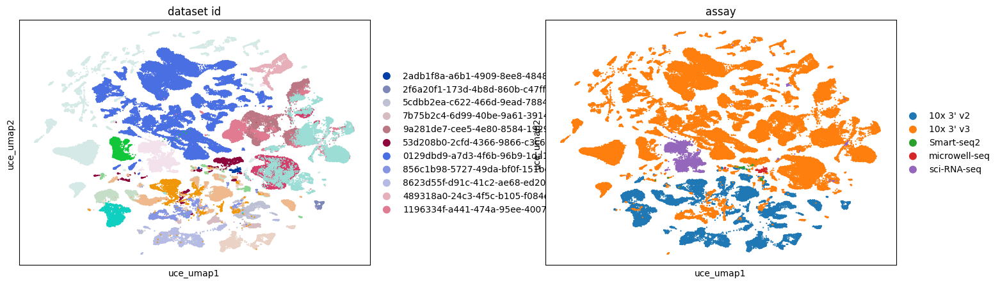

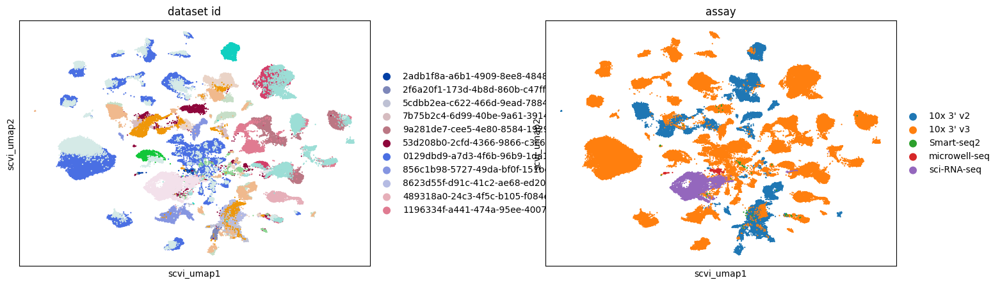

In [61]:
sc.pl.scatter(adata3, basis="geneformer_umap", color=["dataset_id", "assay"],size=10, use_raw=False)
sc.pl.scatter(adata3, basis="scgpt_umap", color=["dataset_id", "assay"],size=10, use_raw=False)
sc.pl.scatter(adata3, basis="uce_umap", color=["dataset_id", "assay"],size=10, use_raw=False)
sc.pl.scatter(adata3, basis="scvi_umap", color=["dataset_id", "assay"],size=10, use_raw=False)

## Retinal bipolar neurons in eye

In a more detailed analysis of retinal bipolar neurons in the eye, we focus on subclustering within this cell type across various embeddings. This involves rerunning UMAP specifically for retinal bipolar neurons and applying Leiden clustering to each embedding. Additionally, we employ [HDBSCAN](https://hdbscan.readthedocs.io/en/latest/how_hdbscan_works.html), a density-based clustering algorithm, on the full pairwise Euclidean distance matrix to compare the clustering results.

Key findings from this analysis include:
 - In the scGPT embedding, the nearest neighbor graph construction reveals 24 distinct clusters, but the density-based HDBSCAN approach identifies only 3 clusters, indicating a significant difference in clustering patterns.
 - The UCE and SCVI embeddings show relatively good agreement between graph-based and density-based clustering methods.
 - For Geneformer, the subclusters observed in UMAP appear to be an artifact of the graph construction, as HDBSCAN results in far fewer and distinctly different clusters.

When assessing the Normalized Mutual Information (NMI) score between Leiden and HDBSCAN cluster assignments, it's found that:
 - All embeddings yield Leiden clusters with generally good agreement across methods (NMI > 0.65), indicating a consistent clustering pattern.
 - HDBSCAN clusterings are more method-specific, reflecting inherent differences in how each embedding interprets distances and densities. Geneformer, in particular, shows minimal agreement with other methods, possibly highlighting a limitation of HDBSCAN in this context.
 - Additionally, all methods, except SCVI, distinctly separate retinal bipolar neurons by batch (dataset ID), underscoring the presence of batch effects.

From this analysis, we can draw a couple conclusions:
 - The construction of k-nearest neighbor graphs in embeddings like UMAP can lead to the identification of subclusters that are not evident when examining pairwise distances directly in the original embedding spaces. This suggests that the reliance of UMAP (and many other methods spanning a wide variety of tasks) on k-nearest neighbor graphs may introduce biologically unjustifiable subclusters. This is a known phenomenon and further supports the recommendation to cross-reference findings using fuller representations of the data.
 - In this example, UCE appears to cluster data more than other methods. This observation holds true in both graph- and density-based clustering, although the effect is more pronounced with k-nearest neighbors. The small clusters identified in UCE sometimes lack unique or biologically relevant gene expression signatures, necessitating further investigation to understand any biological relevance or lack thereof for each of the identified clusters.

### Author note (delete this)

After staring at this for a long time, I've come away with the following conclusion (or rather speculation):

UCE results in embeddings with much higher resolution than other methods. In some instances, this results in clusters with strong, unique gene expression signals. In other cases, the signal is present, but weak and often in genes that may not be biologically interesting (e.g. the very low expression of an entire family of protocadherin genes).  This behavior makes intuitive sense when you consider that UCE does no filtering on the genes and embeds all ~20,000 proteins in the model. If there are some proteins that are subject to technical sources of variation, that information will get encoded into the model.

When I was doing my PhD, I developed an algorithm called Self-Assembling Manifold for dimensionality reduction. It actually tried to achieve a similar goal, which is to obviate the need for doing HVG selection. It did this by determining a weight for each gene and performing soft feature selection by rescaling the gene expression data according to the weights. The entire matrix was then embedded in PC space. I noticed that this approach also resulted in more clusters, a lot of which tended to be similarly hard to justify with a clear biological signal. But, on the other hand, the method was far superior at identifying subtle differences in cell states that other methods could not. It was a tradeoff. I speculate the same thing might apply to UCE.

While advantageous for identifying subtle differences in cell state, the disadvantage is that data integration becomes quite difficult as the method is so sensitive that it will find the batch-specific differences and encode that in the embedding.

Generating UMAP for scgpt
Generating UMAP for uce
Generating UMAP for geneformer
Generating UMAP for scvi
Normalized mutual information between Leiden and HDBSCAN clusters:
0.3477642013378455


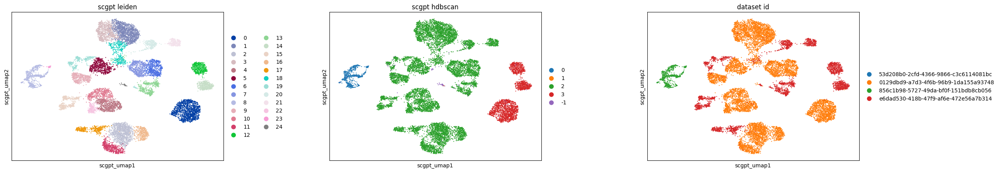

Normalized mutual information between Leiden and HDBSCAN clusters:
0.7849766670176977


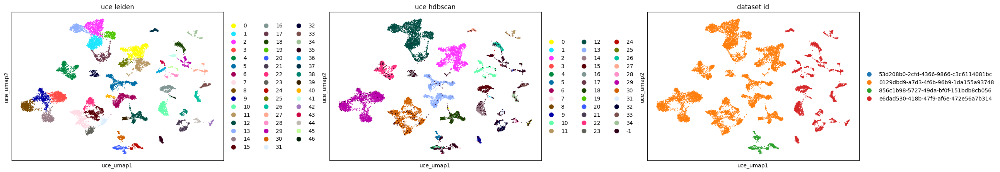

Normalized mutual information between Leiden and HDBSCAN clusters:
0.04421444819580322


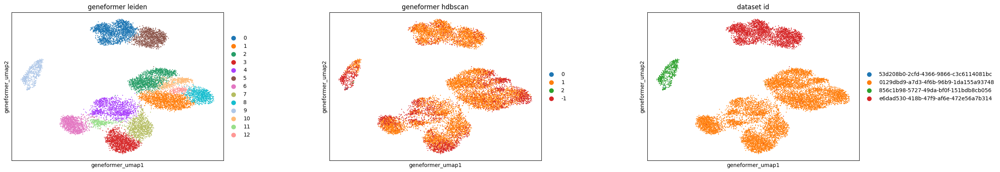

Normalized mutual information between Leiden and HDBSCAN clusters:
0.7682984958619914


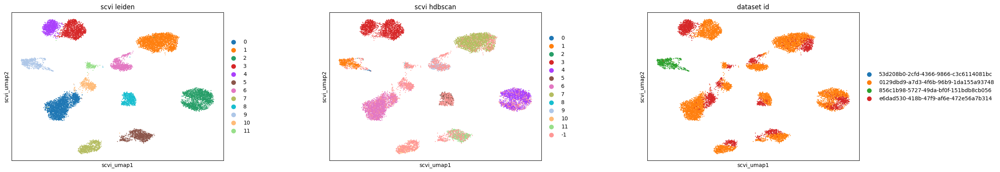

Leiden:
               scgpt       uce  geneformer      scvi
scgpt       1.000000  0.824838    0.720294  0.783092
uce         0.824838  1.000000    0.669740  0.748759
geneformer  0.720294  0.669740    1.000000  0.676791
scvi        0.783092  0.748759    0.676791  1.000000

HDBSCAN:
               scgpt       uce  geneformer      scvi
scgpt       1.000000  0.346146    0.043963  0.427249
uce         0.346146  1.000000    0.040662  0.646750
geneformer  0.043963  0.040662    1.000000  0.027728
scvi        0.427249  0.646750    0.027728  1.000000


In [56]:
import hdbscan
import pandas as pd
from scipy.spatial.distance import pdist, squareform
from sklearn.metrics import normalized_mutual_info_score
# subset anndata
adata_rbn = adata3[adata3.obs['cell_type'] == 'retinal bipolar neuron'].copy()

# generate UMAPs
adata_rbn = generate_umaps_from_embeddings(adata_rbn, list(embedding_uris.keys()))

# run clustering methods
for embedding in embedding_uris:
    sc.tl.leiden(adata_rbn,obsp=f"{embedding}_connectivities", key_added = f"{embedding}_leiden")
    
    points = adata_rbn.obsm[embedding]
    
    # calculate full pairwise distance matrix
    pairwise_dist = squareform(pdist(points, 'euclidean'))
    # run HDBSCAN
    adata_rbn.obs[f"{embedding}_hdbscan"] = hdbscan.HDBSCAN(min_cluster_size=5, min_samples=5, metric="precomputed").fit_predict(pairwise_dist).astype('int').astype('str')

# display UMAPs and report normalized mutual information scores between leiden and hdbscan cluster assignments
for embedding in embedding_uris:
    print("Normalized mutual information between Leiden and HDBSCAN clusters:")
    print(normalized_mutual_info_score(adata_rbn.obs[f"{embedding}_leiden"], adata_rbn.obs[f"{embedding}_hdbscan"]))
    sc.pl.scatter(adata_rbn, basis=f"{embedding}_umap", color=[f"{embedding}_leiden", f"{embedding}_hdbscan", "dataset_id"], size=10, use_raw=False)


# compare leiden and hdbscan cluster assignments across methods and display the similarity tables
embedding_keys = list(embedding_uris.keys())
sim_scores_leiden = np.zeros((len(embedding_keys),len(embedding_keys)))
sim_scores_hdbscan = np.zeros((len(embedding_keys),len(embedding_keys)))
for i,embedding_i in enumerate(embedding_keys):
    for j,embedding_j in enumerate(embedding_keys):
        sim_scores_leiden[i,j] = normalized_mutual_info_score(adata_rbn.obs[f"{embedding_i}_leiden"], adata_rbn.obs[f"{embedding_j}_leiden"])
        sim_scores_hdbscan[i,j] = normalized_mutual_info_score(adata_rbn.obs[f"{embedding_i}_hdbscan"], adata_rbn.obs[f"{embedding_j}_hdbscan"])

sim_scores_leiden_table = pd.DataFrame(data=sim_scores_leiden,index=embedding_keys,columns=embedding_keys)
sim_scores_hdbscan_table = pd.DataFrame(data=sim_scores_hdbscan,index=embedding_keys,columns=embedding_keys)

print("Leiden:")
print(sim_scores_leiden_table)
print("")
print("HDBSCAN:")
print(sim_scores_hdbscan_table)